In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json
import time
from datetime import datetime, timedelta
from shapely.geometry import Point
from busSim import BusSim

In [2]:
DATA_PATH = "./data"
DAY = "monday"
START_TIME = "12:00:00"
ELAPSE_TIME = "00:30:00"
AVG_WALKING_SPEED = 1.4 # 1.4 meters per second
MAX_WALKING_MIN = 10

32092971.01932718

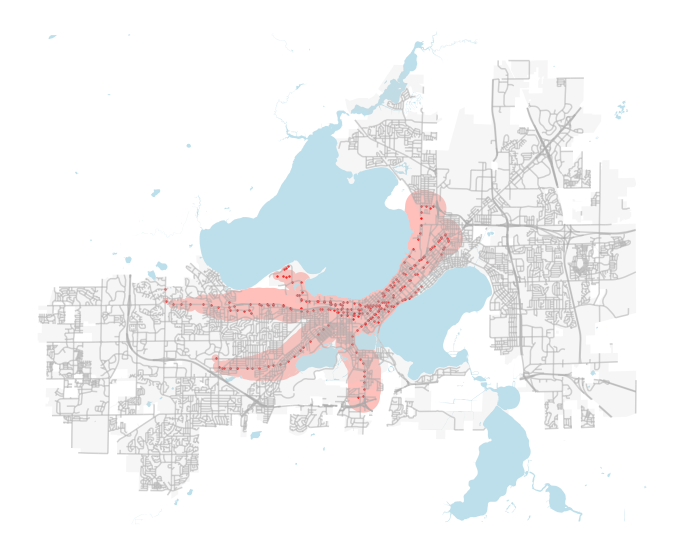

In [3]:
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN)
gdf = busSim.get_gdf(start_point=(43.073691, -89.387407))
city = gpd.read_file("./data/plot/background/madison-shp")
lakes = gpd.read_file("./data/plot/background/water-shp")
street = gpd.read_file("./data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()
busSim.get_area(gdf) #21786807.680050697

39675000.75799087

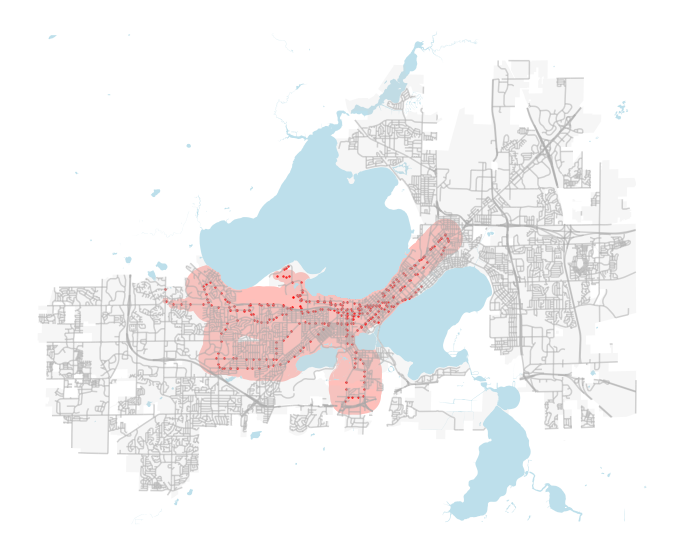

In [4]:
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN)
gdf = busSim.get_gdf(765)
city = gpd.read_file("./data/plot/background/madison-shp")
lakes = gpd.read_file("./data/plot/background/water-shp")
street = gpd.read_file("./data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()
busSim.get_area(gdf) #21786807.680050697

39675000.75799087

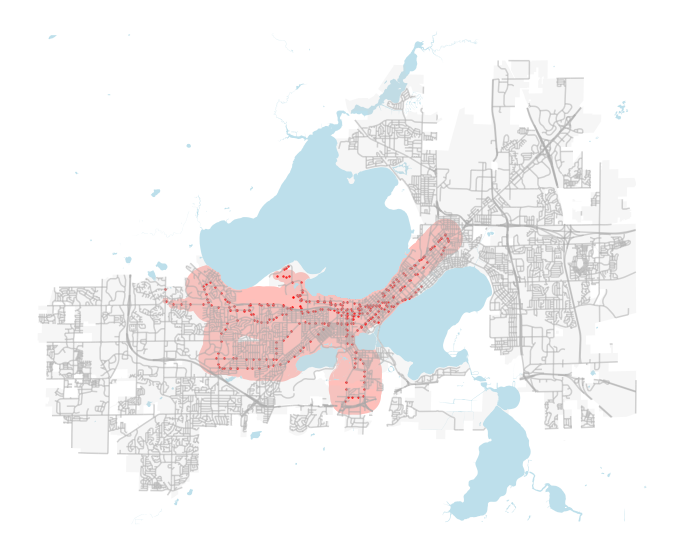

In [10]:
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN, trip_delays=[(1024695, "00:04:00")])
gdf = busSim.get_gdf(765)
city = gpd.read_file("./data/plot/background/madison-shp")
lakes = gpd.read_file("./data/plot/background/water-shp")
street = gpd.read_file("./data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()
busSim.get_area(gdf) #20682522.238682237

# TEST

In [9]:
path = "./data"
mmt_gtfs_path = os.path.join(path, "mmt_gtfs")
stops_df = pd.read_csv(os.path.join(
    mmt_gtfs_path, "stops.csv"), sep=",")
trips_df = pd.read_csv(os.path.join(
    mmt_gtfs_path, "trips.csv"), sep=",")
stopTimes_df = pd.read_csv(os.path.join(
    mmt_gtfs_path, "stop_times.csv"), sep=",")
calendar_df = pd.read_csv(os.path.join(
    mmt_gtfs_path, "calendar.csv"), sep=",")

calendar_df

,service_id,service_name,monday,tuesday,wednesday,thursday,friday,saturday,sunday,start_date,end_date
0,93_D24,December 24,0,0,0,0,0,0,0,20201004,20201128
1,93_D31,December 31,0,0,0,0,0,0,0,20201004,20201128
2,93_HOL,Holiday,0,0,0,0,0,0,0,20201004,20201128
3,93_HOL:R,Recess Holiday,0,0,0,0,0,0,0,20201004,20201128
4,93_MWK,Modified,0,0,0,0,0,0,0,20201004,20201128
5,93_MWK:R,Recess Modified,0,0,0,0,0,0,0,20201004,20201128
6,93_SAT,Saturday,0,0,0,0,0,1,0,20201004,20201128
7,93_SAT:L,Latenight Saturday,0,0,0,0,0,1,0,20201004,20201128
8,93_SAT:R,Recess Saturday,0,0,0,0,0,0,0,20201004,20201128
9,93_SAT:S,Standard Saturday,0,0,0,0,0,1,0,20201004,20201128


In [25]:
def test(service_ids):
    trips_df1 = trips_df[trips_df["service_id"].isin(service_ids)]
    stopTimes_filtered_df = trips_df1.merge(stopTimes_df, on="trip_id")
    stopTimes_merged_df = stopTimes_filtered_df.merge(stops_df, on="stop_id")[["service_id", "route_short_name", "trip_id", "stop_id", "stop_sequence", "arrival_time", "shape_dist_traveled", "stop_lat", "stop_lon", "cardinal_direction"]]
    stopTimes_merged_df['arrival_time'] = pd.to_timedelta(
                stopTimes_merged_df['arrival_time'])
    return stopTimes_merged_df.sort_values(by="arrival_time")

In [26]:
test(service_ids = ["94_SAT"])

,service_id,route_short_name,trip_id,stop_id,stop_sequence,arrival_time,shape_dist_traveled,stop_lat,stop_lon,cardinal_direction
27132,94_SAT,22,1029033,5142,1,0 days 05:53:00,0.0932,43.133799,-89.373212,270.0
27151,94_SAT,22,1029033,5178,2,0 days 05:53:42,0.3207,43.133855,-89.377734,270.0
15367,94_SAT,6,1026689,1650,1,0 days 05:54:00,0.0247,43.084716,-89.370296,270.0
27170,94_SAT,22,1029033,5260,3,0 days 05:54:08,0.4636,43.133856,-89.380576,270.0
27189,94_SAT,22,1029033,5796,4,0 days 05:54:36,0.6146,43.133866,-89.383590,270.0
...,...,...,...,...,...,...,...,...,...,...
12702,94_SAT,6,1026655,1323,39,0 days 23:26:15,6.1815,43.076331,-89.381475,90.0
12737,94_SAT,6,1026655,1579,40,0 days 23:27:04,6.3766,43.078282,-89.378684,90.0
12772,94_SAT,6,1026655,1927,41,0 days 23:28:07,6.6271,43.080805,-89.375127,90.0
12807,94_SAT,6,1026655,1565,42,0 days 23:28:45,6.7818,43.082353,-89.372916,90.0


In [27]:
test(service_ids = ["94_SAT:L"])

,service_id,route_short_name,trip_id,stop_id,stop_sequence,arrival_time,shape_dist_traveled,stop_lat,stop_lon,cardinal_direction
0,94_SAT:L,81,1031598,99,1,0 days 18:35:00,0.0224,43.075745,-89.400179,90.0
34,94_SAT:L,81,1031598,25,2,0 days 18:36:00,0.1853,43.075691,-89.396944,90.0
51,94_SAT:L,81,1031598,89,3,0 days 18:37:38,0.4522,43.076844,-89.392142,90.0
68,94_SAT:L,81,1031598,45,4,0 days 18:38:38,0.6153,43.078482,-89.389820,90.0
85,94_SAT:L,81,1031598,96,5,0 days 18:39:29,0.7552,43.077515,-89.388055,180.0
...,...,...,...,...,...,...,...,...,...,...
866,94_SAT:L,82,1031676,43,22,1 days 03:12:37,3.7416,43.070811,-89.397884,90.0
883,94_SAT:L,82,1031676,39,23,1 days 03:13:11,3.8286,43.071895,-89.397341,0.0
900,94_SAT:L,82,1031676,765,24,1 days 03:13:43,3.9101,43.073076,-89.397291,0.0
917,94_SAT:L,82,1031676,49,25,1 days 03:14:50,4.0810,43.075529,-89.397191,0.0


In [28]:
test(service_ids = ["94_SAT:R"])

,service_id,route_short_name,trip_id,stop_id,stop_sequence,arrival_time,shape_dist_traveled,stop_lat,stop_lon,cardinal_direction
0,94_SAT:R,80,1031352,2082,1,0 days 07:15:00,0.0232,43.086328,-89.438587,270.0
22,94_SAT:R,80,1031352,2054,2,0 days 07:15:39,0.2000,43.086668,-89.441612,270.0
44,94_SAT:R,80,1031352,2039,3,0 days 07:16:49,0.5136,43.089158,-89.438057,0.0
66,94_SAT:R,80,1031352,2061,4,0 days 07:17:04,0.5820,43.089784,-89.437007,0.0
88,94_SAT:R,80,1031352,2071,5,0 days 07:17:24,0.6717,43.090501,-89.435587,0.0
...,...,...,...,...,...,...,...,...,...,...
153,94_SAT:R,80,1031373,2034,24,0 days 23:30:42,4.0277,43.086445,-89.433772,180.0
175,94_SAT:R,80,1031373,2048,25,0 days 23:31:04,4.1706,43.084386,-89.433784,180.0
197,94_SAT:R,80,1031373,2881,26,0 days 23:31:48,4.4487,43.084225,-89.429092,90.0
219,94_SAT:R,80,1031373,2050,27,0 days 23:32:26,4.6886,43.080886,-89.428351,180.0


In [29]:
test(service_ids = ["94_SAT:S"])

,service_id,route_short_name,trip_id,stop_id,stop_sequence,arrival_time,shape_dist_traveled,stop_lat,stop_lon,cardinal_direction
0,94_SAT:S,80,1031316,2082,1,0 days 07:15:00,0.0232,43.086328,-89.438587,270.0
36,94_SAT:S,80,1031316,2054,2,0 days 07:15:39,0.2000,43.086668,-89.441612,270.0
72,94_SAT:S,80,1031316,2039,3,0 days 07:16:49,0.5136,43.089158,-89.438057,0.0
108,94_SAT:S,80,1031316,2061,4,0 days 07:17:04,0.5820,43.089784,-89.437007,0.0
144,94_SAT:S,80,1031316,2071,5,0 days 07:17:24,0.6717,43.090501,-89.435587,0.0
...,...,...,...,...,...,...,...,...,...,...
251,94_SAT:S,80,1031342,2034,24,1 days 02:50:42,4.0277,43.086445,-89.433772,180.0
287,94_SAT:S,80,1031342,2048,25,1 days 02:51:04,4.1706,43.084386,-89.433784,180.0
323,94_SAT:S,80,1031342,2881,26,1 days 02:51:48,4.4487,43.084225,-89.429092,90.0
359,94_SAT:S,80,1031342,2050,27,1 days 02:52:26,4.6886,43.080886,-89.428351,180.0


SAT: 36302
SAT:R: 998
